#  Prep

## Dataset

In [1]:
# https://www.kaggle.com/uciml/red-wine-quality-cortez-et-al-2009

## Import libs

In [110]:
import numpy as np
import pandas as pd
import pandas_profiling as pp
import matplotlib.pyplot as plt
import seaborn as sns
sns.set() 
%matplotlib inline



######################## 
# preprocessing

# handle na
from sklearn.impute import SimpleImputer, KNNImputer

# scaler
from sklearn.preprocessing import StandardScaler, RobustScaler

# discretize
from sklearn.preprocessing import Binarizer
from sklearn.preprocessing import KBinsDiscretizer

# categorical
from sklearn.preprocessing import OneHotEncoder

# pipeline
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# transform
from sklearn.preprocessing import PowerTransformer
from sklearn.base import BaseEstimator
from sklearn.base import TransformerMixin

# PCA
from sklearn.decomposition import PCA

# feature selection
from sklearn.feature_selection import SelectKBest 
from scipy.stats import pearsonr

######################## 
# model
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.model_selection import GridSearchCV

import lightgbm as lgb

import statsmodels.api as sm
import statsmodels.formula.api as smf

######################## 
# metrics
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate



import warnings
warnings.filterwarnings('ignore')

## Performance meausre

In [3]:
# Evaluation metric: R squared

# Get data and exploratory data analysis

In [4]:
data = pd.read_csv('winequality-red2.csv')

data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1564.000000,1596.000000,1562.000000,1596.000000,1572.000000,1596.000000,1594.000000,1569.00000,1596.000000,1598.000000,1599.000000
mean,8.319637,0.524930,0.270595,2.550736,0.086742,15.916031,46.392231,0.989849,3.31731,0.658014,10.422935,5.636023
std,1.741096,0.178466,0.195045,1.422548,0.054360,10.437804,32.791714,0.275442,0.28676,0.169542,1.065999,0.807569
min,4.600000,-0.400000,-0.100000,0.900000,-1.000000,1.000000,6.000000,-10.000000,-0.10000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.21000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.31000,0.620000,10.200000,6.000000
75%,9.200000,0.635000,0.420000,2.600000,0.090000,22.000000,62.000000,0.997837,3.40000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,10.00000,2.000000,14.900000,8.000000


volatile, citric acid, chlorides, density, pH have outlier values that are due to record mistake.


## Identify numeric vs categorical variables

In [5]:
columns = data.columns[:-1]
categorical_features = data.select_dtypes(include=['object']).columns.tolist()
numeric_features = data.select_dtypes(exclude=['object']).columns.tolist()
numeric_features.remove('quality')

print('Categorical features:', categorical_features)
print('Numeric features:', numeric_features)

Categorical features: []
Numeric features: ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol']


## Train test split

In [6]:
train_all_ratio = 0.9
train_ratio = 0.8

X, y = data.iloc[:,:-1], data['quality']
num_observations = X.shape[0]

X_train_all, X_test, y_train_all, y_test = train_test_split(X, y, shuffle=True, train_size=train_all_ratio, random_state=42)
# X_train, X_valid, y_train, y_valid = train_test_split(X_train_all, y_train_all, shuffle=True, train_size=train_ratio, random_state=42)

data_train_all = X_train_all.copy()
data_train_all['quality'] = y_train_all


print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')
print(f'X_train_all shape: {X_train_all.shape}')
print(f'y_train_all shape: {y_train_all.shape}')
print(f'X_test shape: {X_test.shape}')
print(f'y_test shape: {y_test.shape}')

X shape: (1599, 11)
y shape: (1599,)
X_train_all shape: (1439, 11)
y_train_all shape: (1439,)
X_test shape: (160, 11)
y_test shape: (160,)


## Basic EDA

In [7]:
report = pp.ProfileReport(data)

report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Check the distribution

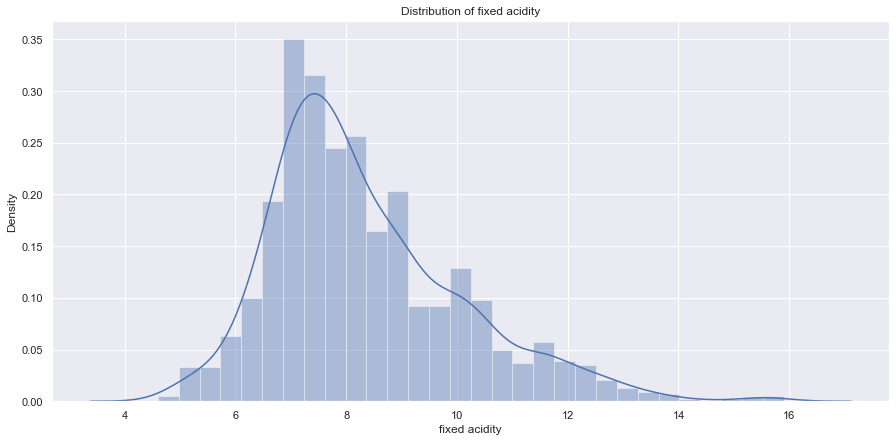

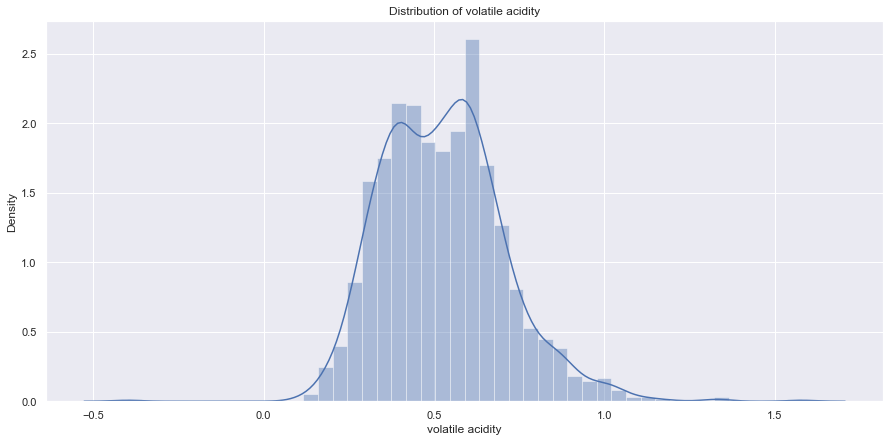

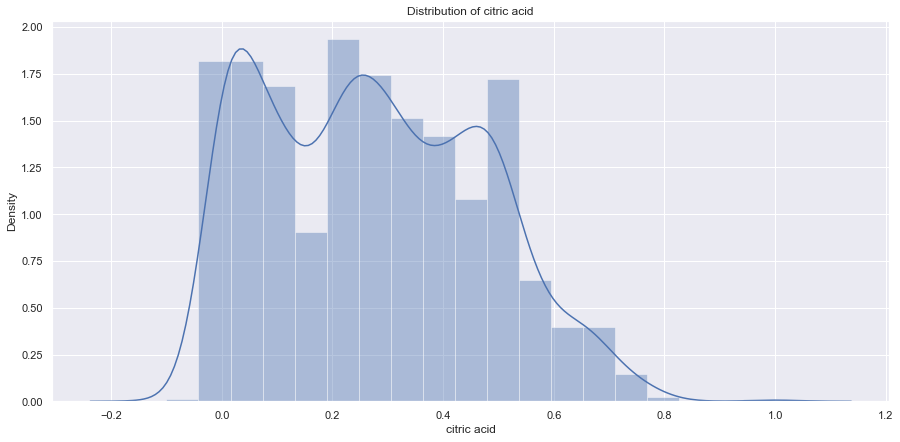

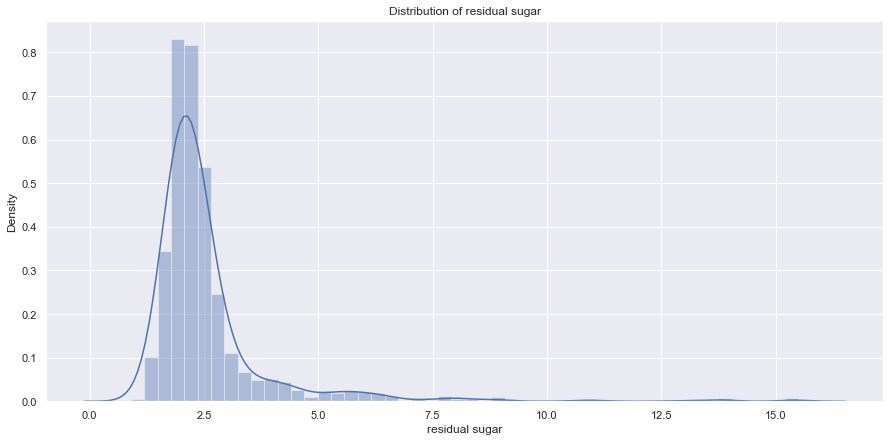

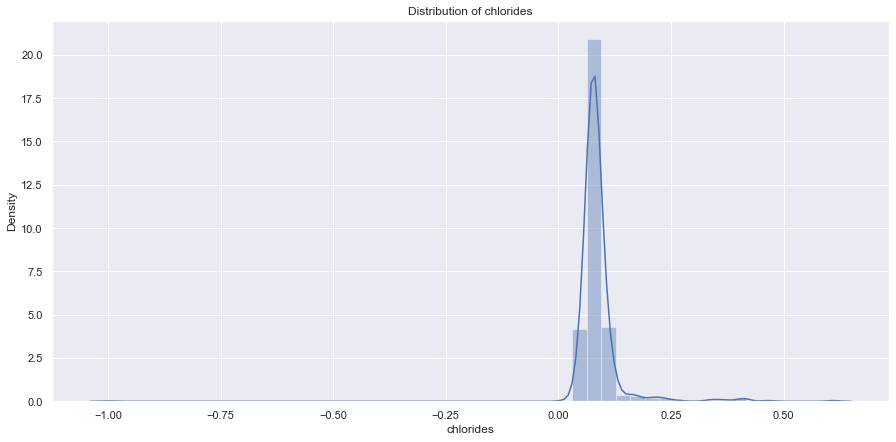

...

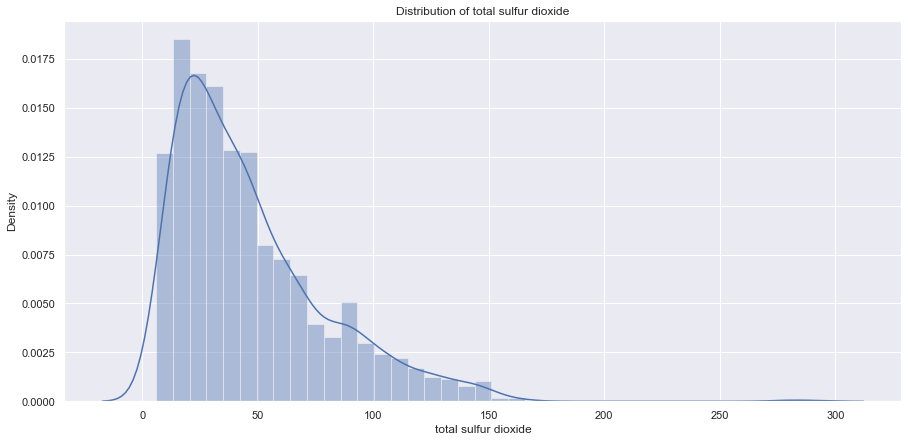

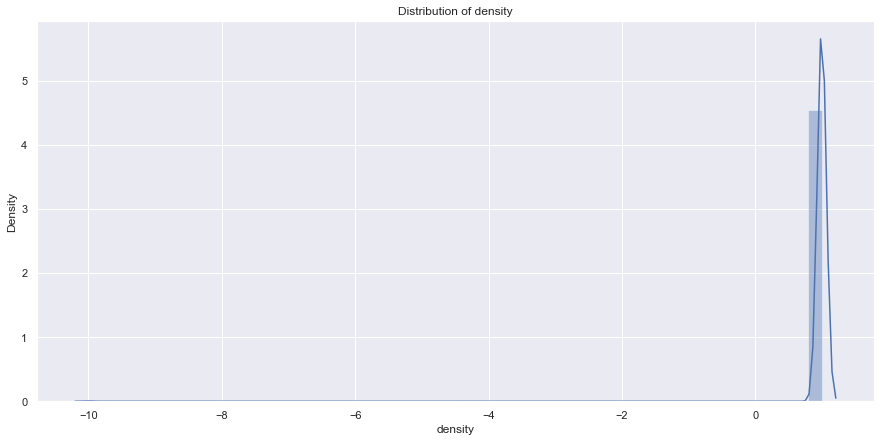

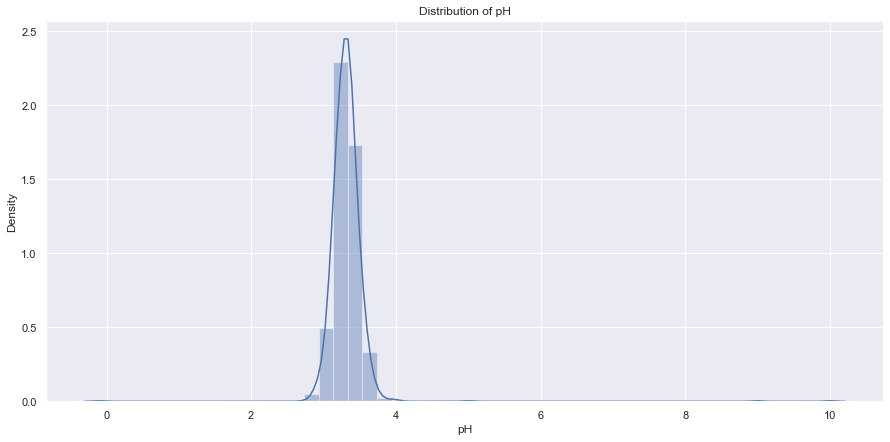

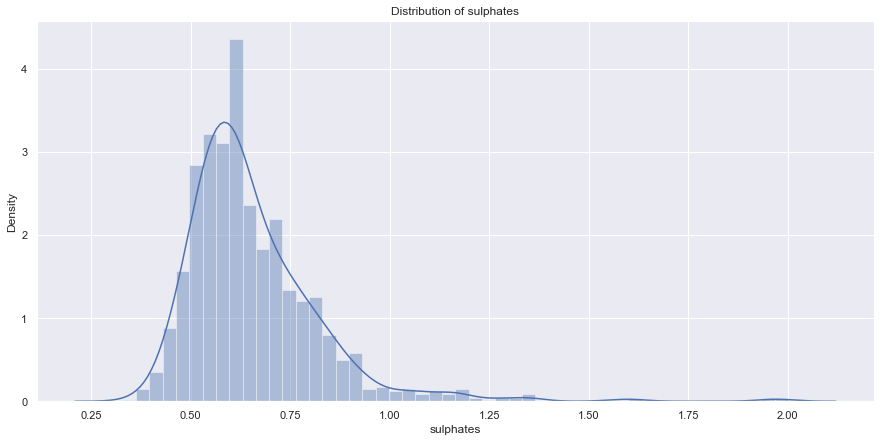

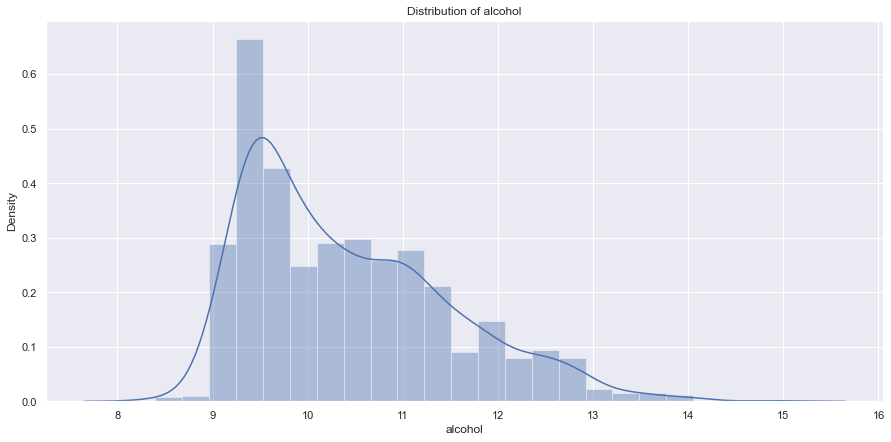

In [8]:
for col in numeric_features:
    plt.figure(figsize=(15,7))
    sns.distplot(X_train_all[col])
    plt.title(f'Distribution of {col}')
    

## Check the sparsity

,Missing value percent
fixed acidity,0.00%
volatile acidity,1.94%
citric acid,0.19%
residual sugar,2.06%
chlorides,0.19%
free sulfur dioxide,1.31%
total sulfur dioxide,0.19%
density,0.31%
pH,1.81%
sulphates,0.19%


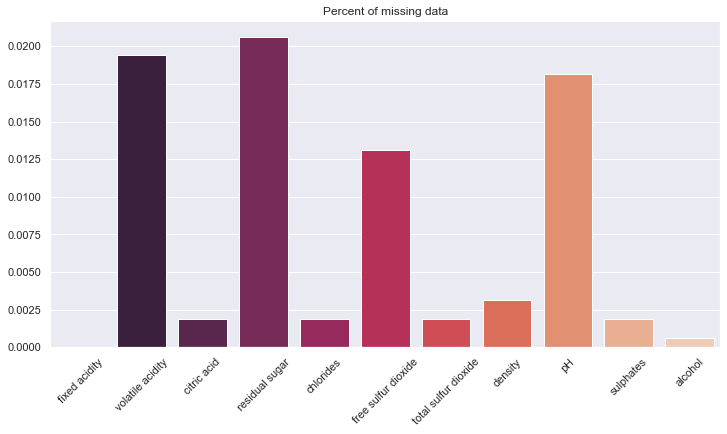

In [9]:
nan_percent = pd.isnull(X_train_all).sum(axis=0)/data.shape[0]

plt.figure(figsize=(12,6))
sns.barplot(x=nan_percent.index, y=nan_percent, palette='rocket')
plt.xticks(rotation=45)
plt.title('Percent of missing data')

nan_percent.to_frame().rename(columns={0: 'Missing value percent'}).style.format("{:.2%}")

## Check wrong values

In [10]:
value_interval = {
    'fixed acidity': [0, float('inf')], 
    'volatile acidity': [0, float('inf')], 
    'citric acid': [0, float('inf')], 
    'residual sugar': [0, float('inf')], 
    'chlorides': [0, float('inf')], 
    'free sulfur dioxide': [0, float('inf')],
    'total sulfur dioxide': [0, float('inf')],
    'density': [0, float('inf')],
    'pH': [0, float('inf')],
    'sulphates': [0, float('inf')],
    'alcohol': [0, float('inf')], 
}

for col in numeric_features:
    lower_bound, upper_bound = value_interval[col]
    min_val, max_val = min(X_train_all[col]), max(X_train_all[col])
    if min_val < lower_bound:
        print(f'{col}: lower_bound={lower_bound}, min_val={min_val}')
    if max_val > upper_bound:
        print(f'{col}: upper_bound={upper_bound}, max_val={max_val}')

volatile acidity: lower_bound=0, min_val=-0.4
citric acid: lower_bound=0, min_val=-0.1
chlorides: lower_bound=0, min_val=-1.0
density: lower_bound=0, min_val=-10.0
pH: lower_bound=0, min_val=-0.1


## Linear relationship

Text(0.5, 1.0, 'Top negative correlated featurs')

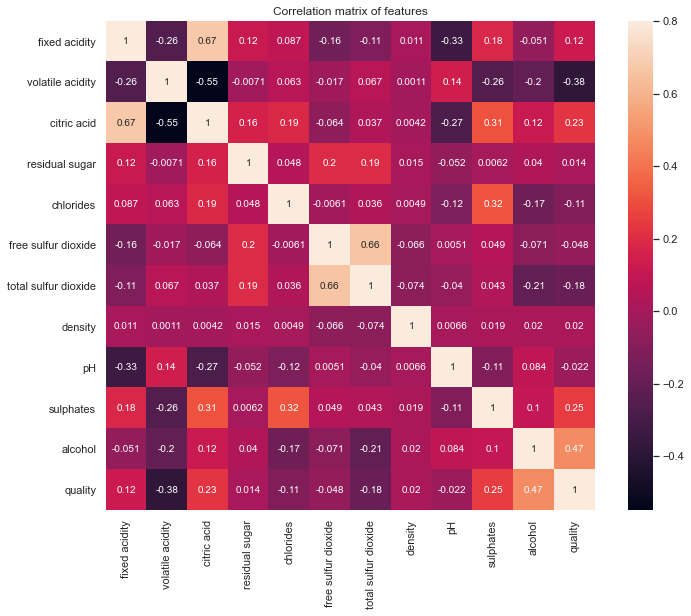

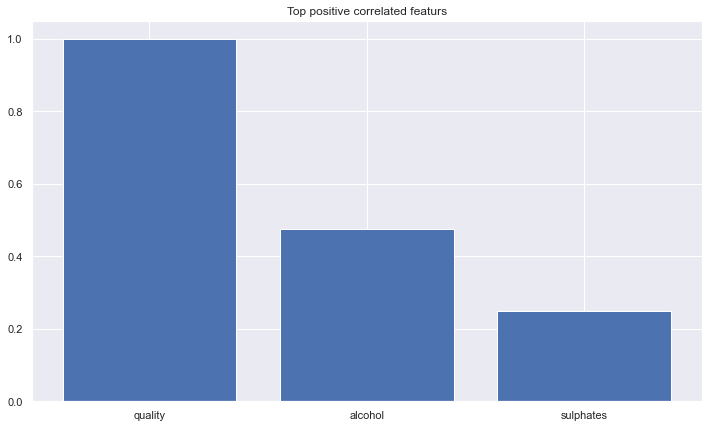

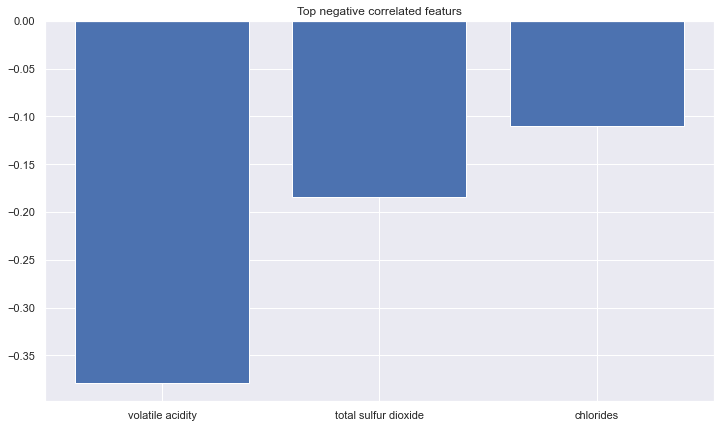

In [11]:
corrmat = data_train_all.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True, annot=True);
plt.title('Correlation matrix of features')

plt.subplots(figsize=(12, 7))
top_corr_features = corrmat['quality'].sort_values(ascending=False).iloc[:3]
plt.bar(top_corr_features.index, top_corr_features.values)
plt.title('Top positive correlated featurs')

plt.subplots(figsize=(12, 7))
top_corr_features = corrmat['quality'].sort_values(ascending=True).iloc[:3]
plt.bar(top_corr_features.index, top_corr_features.values)
plt.title('Top negative correlated featurs')

## Non-linear relationship

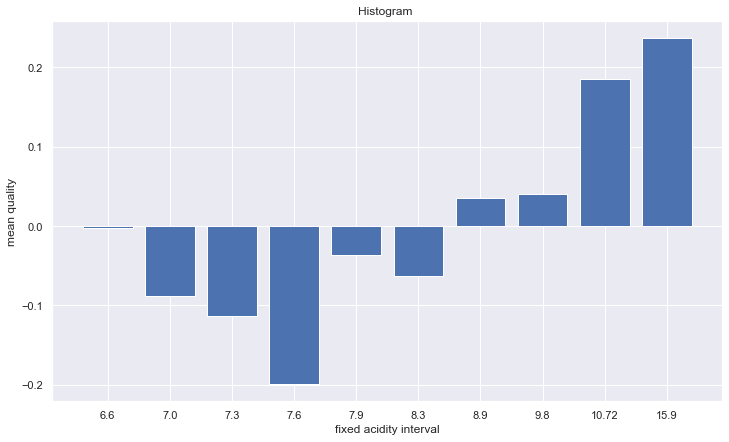

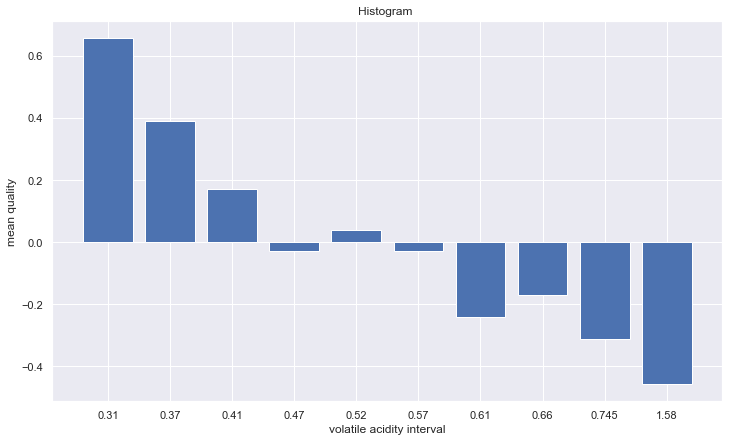

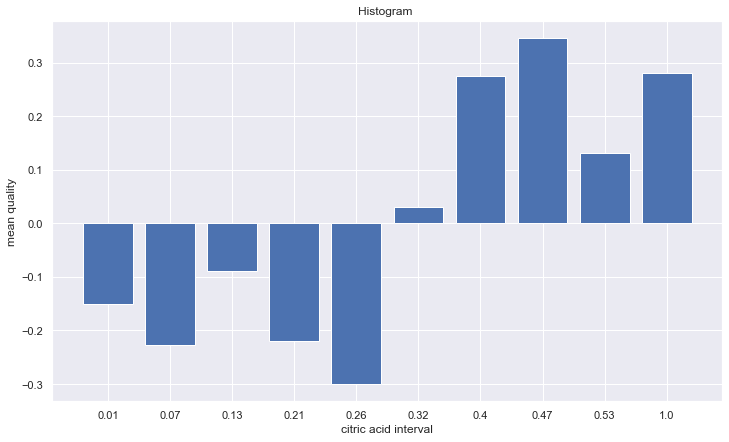

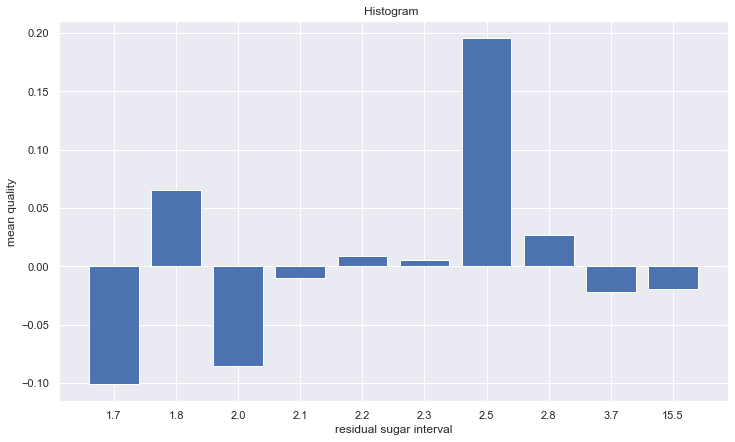

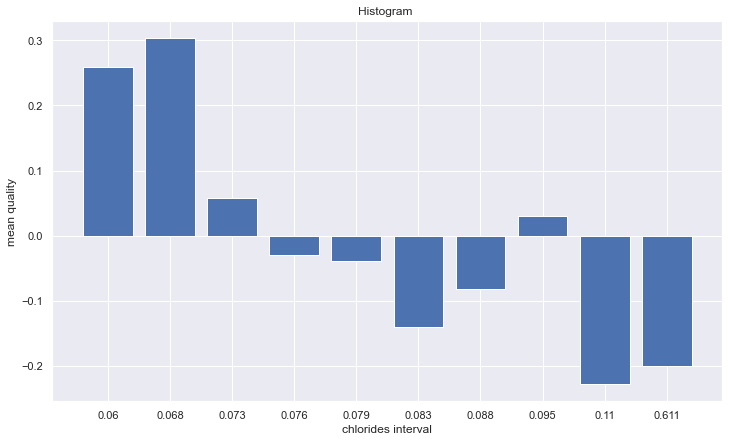

...

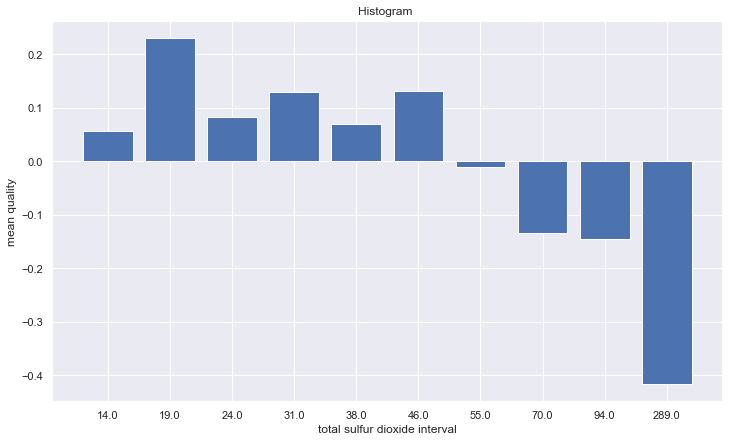

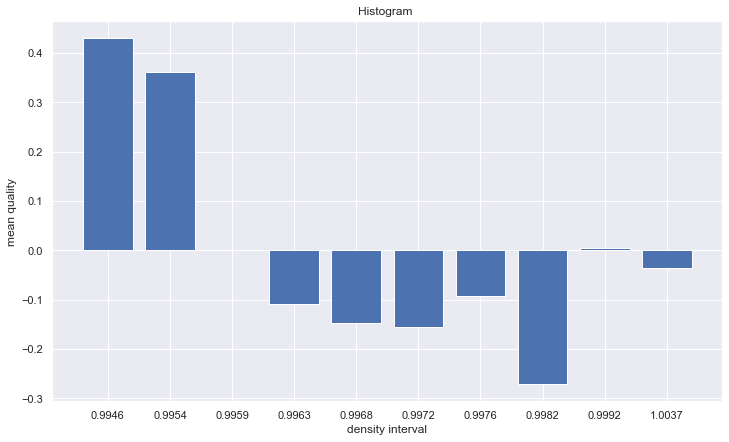

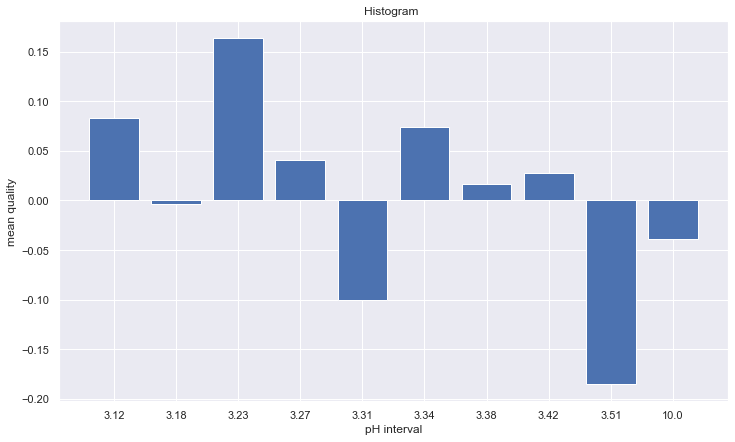

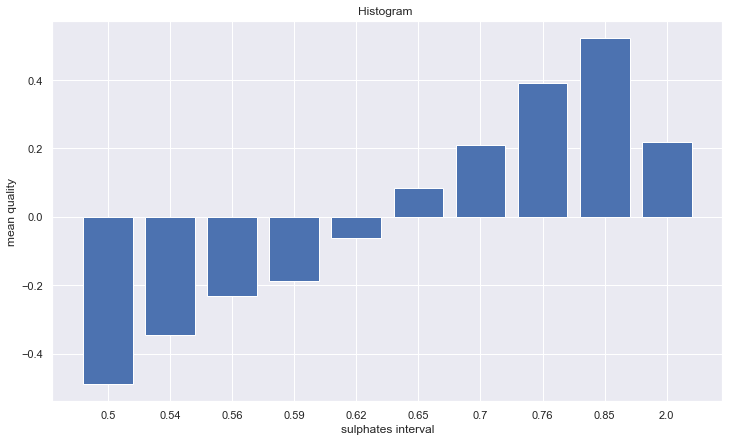

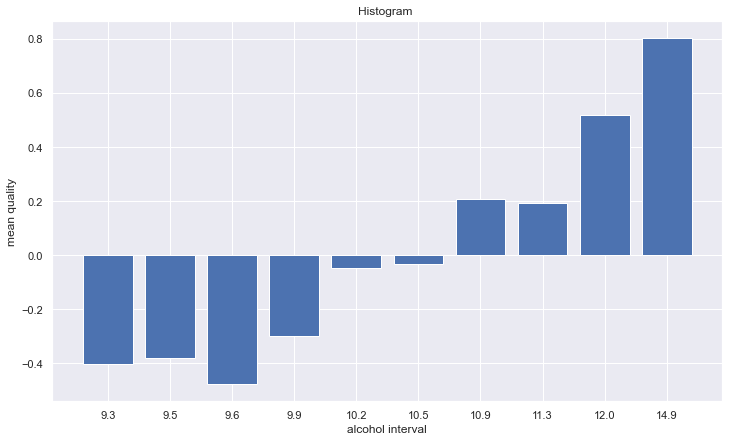

In [12]:
for col in numeric_features:
    plt.subplots(figsize=(12, 7))
    histogram = data_train_all[['quality',col]].groupby(pd.qcut(X_train_all[col], 10)).mean()['quality'] - data_train_all['quality'].mean()
    index_right = [str(x.right) for x in histogram.index.tolist()]
    plt.bar(index_right, histogram.values)
    plt.xlabel(f'{col} interval')
    plt.ylabel(f'mean quality')
    plt.title('Histogram ')

# Prepare the data

## Cleaning missing values

### Remove columns

### Remove rows that has large percentage of NaNs

In [13]:
# check sparsity of row data and remove sparse rows
def check_sparsity_rows(df, remove_threshold=1):
    remove_row = list(df[df.isnull().mean(axis=1) > remove_threshold].index)
    keep_row = list(df[df.isnull().mean(axis=1) <= remove_threshold].index)

    print(f'Percent of Removed Rows: {len(remove_row)/df.shape[0]:.2%}')
    return keep_row

keep_row = check_sparsity_rows(X_train_all, remove_threshold=0.8)
X_train_all = X_train_all.loc[keep_row, :]
y_train_all = y_train_all.loc[keep_row]
print("X_train_all shape: ", X_train_all.shape)
print("y_train_all shape: ", y_train_all.shape)

Percent of Removed Rows: 0.21%
X_train_all shape:  (1436, 11)
y_train_all shape:  (1436,)


### Imputation

In [14]:
# remove wrong values, fill as nan
for col in numeric_features:
    lower_bound, upper_bound = value_interval[col]
    X_train_all[col][X_train_all[col]<lower_bound] = np.nan
    X_train_all[col][X_train_all[col]>upper_bound] = np.nan
    X_test[col][X_test[col]<lower_bound] = np.nan
    X_test[col][X_test[col]>upper_bound] = np.nan

## Handle outliers

### Check the outliers

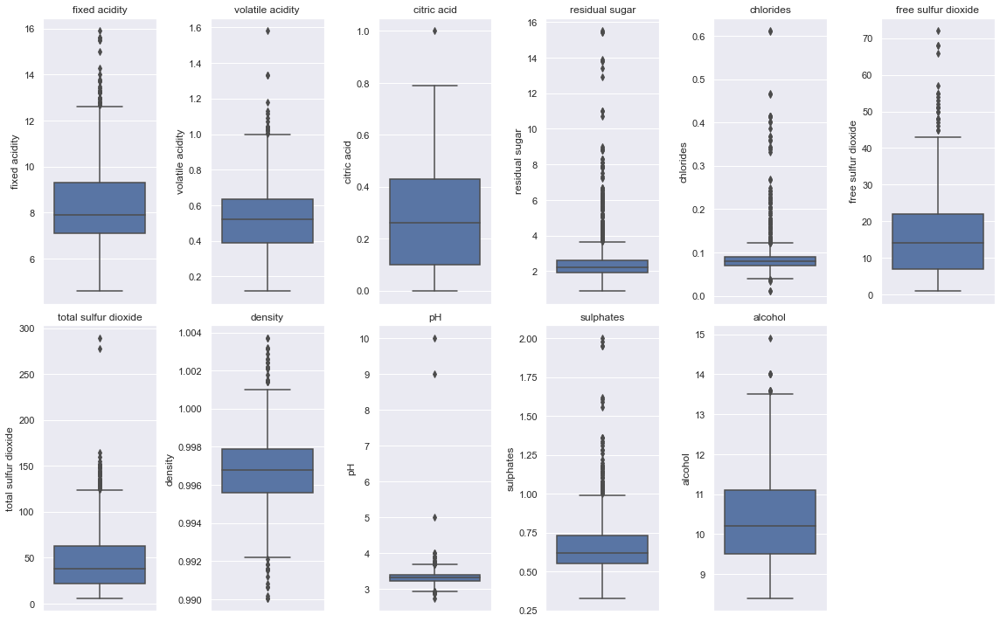

In [15]:
plt.figure(figsize=(16,10))

for i, col in enumerate(numeric_features):    
    plt.subplot(2,6,i + 1)
    sns.boxplot(y=col, data=X_train_all)
    plt.title(col)

plt.tight_layout()


### Univariate outlier, winsorize

In [16]:
class Winsorize(BaseEstimator, TransformerMixin):
    def __init__(self):
        super().__init__()
        self.med_ = None
        self.mad_ = None

    def fit(self, X, y=None):
        self.med_ = np.mean(X, axis=0)        
        self.mad_ = np.median(np.abs(X - self.med_), axis=0)

        return self

    def transform(self, X, y=None):
        col_len = X.shape[1]
        for i in range(col_len):
            val = X[:,i]
            X[:,i][val>self.med_[i]+2*self.mad_[i]] = self.med_[i] + 2*self.mad_[i]
            X[:,i][val<self.med_[i]-2*self.mad_[i]] = self.med_[i] - 2*self.mad_[i]        

        return X

## Transformation and feature engineering

## PCA on correlated features

## Feature selection

## Build pipeline

In [46]:

numeric_transformer = Pipeline(steps=[
    ('imputer', KNNImputer(n_neighbors=5)),
    ('winsorize', Winsorize()),
    ('scale', RobustScaler()),
])

# numeric_transformer = Pipeline(steps=[
#     ('imputer', SimpleImputer(missing_values=np.nan, strategy='median')),
#     ('winsorize', Winsorize()),
#     ('scale', RobustScaler()),
# ])

# numeric_transformer = Pipeline(steps=[
#     ('imputer', SimpleImputer(missing_values=np.nan, strategy='constant', fill_value=0)),
#     ('winsorize', Winsorize()),
#     ('scale', RobustScaler()),
# ])


categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore')),
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features),         
    ]
)

X_train_all_trans = preprocessor.fit_transform(X_train_all)

In [35]:
X_train_all_trans.shape

(1436, 11)

# Model building

In [69]:
def run_model(model_pipleline, X_train_all, y_train_all):
    # https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter
    metrics = ['r2', 'neg_mean_squared_error']
    scores = cross_validate(model_pipeline, X_train_all, y_train_all, cv=5, scoring=(*metrics,))
    mean_r2 = scores['test_r2'].mean()
    
    for metric in metrics: 
        print(f'{metric:10}:', f'{scores[f"test_{metric}"].mean():.2%}')
    
    model_pipeline.fit(X_train_all, y_train_all)
    return model_pipeline, mean_r2


## Baseline model: regression

In [67]:
model_pipeline = Pipeline([
     ('preprocessor', preprocessor),
     ('reg', LinearRegression())
])

model_pipeline, mean_r2 = run_model(model_pipeline, X_train_all, y_train_all)

0.3482276311059418
r2        : 34.82%
neg_mean_squared_error: -42.28%


In [57]:
model_pipeline['reg'].coef_

array([ 0.05328409, -0.26030048, -0.09294642,  0.00246886, -0.07513517,
        0.03217039, -0.08917052, -0.02811373, -0.10032528,  0.29284682,
        0.48942202])

## Ridge/Lasso

In [51]:
for alpha in [0.0001, 0.001, 0.01, 0.1, 1]:
    print()
    print(f'Ridge: alpha={alpha:.4f}')
    model_pipeline = Pipeline([
         ('preprocessor', preprocessor),
         ('reg', Ridge(alpha=alpha))
    ])

    model_pipeline, mean_r2 = run_model(model_pipeline, X_train_all, y_train_all)


Ridge: alpha=0.0000
r2        : 34.82%
neg_mean_squared_error: -42.28%

Ridge: alpha=0.0010
r2        : 34.82%
neg_mean_squared_error: -42.28%

Ridge: alpha=0.0100
r2        : 34.82%
neg_mean_squared_error: -42.28%

Ridge: alpha=0.1000
r2        : 34.82%
neg_mean_squared_error: -42.28%

Ridge: alpha=1.0000
r2        : 34.83%
neg_mean_squared_error: -42.28%


In [55]:
for alpha in [0, 0.0001, 0.001, 0.01, 0.1, 1]:
    print()
    print(f'Lasso: alpha={alpha:.4f}')
    model_pipeline = Pipeline([
         ('preprocessor', preprocessor),
         ('reg', Lasso(alpha=alpha))
    ])

    model_pipeline, mean_r2 = run_model(model_pipeline, X_train_all, y_train_all)


Lasso: alpha=0.0000
r2        : 34.82%
neg_mean_squared_error: -42.28%

Lasso: alpha=0.0001
r2        : 34.83%
neg_mean_squared_error: -42.28%

Lasso: alpha=0.0010
r2        : 34.85%
neg_mean_squared_error: -42.27%

Lasso: alpha=0.0100
r2        : 34.57%
neg_mean_squared_error: -42.46%

Lasso: alpha=0.1000
r2        : 26.41%
neg_mean_squared_error: -47.82%

Lasso: alpha=1.0000
r2        : -0.12%
neg_mean_squared_error: -64.96%


## Random Forest


Random Forest: max_depth=2.0000, n_estimators=5
r2        : 28.87%
neg_mean_squared_error: -46.11%

Random Forest: max_depth=2.0000, n_estimators=20
r2        : 29.76%
neg_mean_squared_error: -45.57%

Random Forest: max_depth=2.0000, n_estimators=50
r2        : 29.89%
neg_mean_squared_error: -45.49%

Random Forest: max_depth=2.0000, n_estimators=100
r2        : 29.79%
neg_mean_squared_error: -45.55%

Random Forest: max_depth=2.0000, n_estimators=150
r2        : 30.07%
neg_mean_squared_error: -45.37%

Random Forest: max_depth=2.0000, n_estimators=200
r2        : 29.94%
neg_mean_squared_error: -45.45%

Random Forest: max_depth=3.0000, n_estimators=5
r2        : 31.81%
neg_mean_squared_error: -44.17%

Random Forest: max_depth=3.0000, n_estimators=20
r2        : 33.97%
neg_mean_squared_error: -42.84%

Random Forest: max_depth=3.0000, n_estimators=50
r2        : 34.07%
neg_mean_squared_error: -42.77%

Random Forest: max_depth=3.0000, n_estimators=100
r2        : 34.11%
neg_mean_squared_err


Random Forest: max_depth=20.0000, n_estimators=100
r2        : 45.74%
neg_mean_squared_error: -35.18%

Random Forest: max_depth=20.0000, n_estimators=150
r2        : 46.29%
neg_mean_squared_error: -34.84%

Random Forest: max_depth=20.0000, n_estimators=200
r2        : 46.30%
neg_mean_squared_error: -34.83%

Random Forest: max_depth=2.0000, n_estimators=5
r2        : 28.87%
neg_mean_squared_error: -46.11%

Random Forest: max_depth=2.0000, n_estimators=20
r2        : 29.76%
neg_mean_squared_error: -45.57%

Random Forest: max_depth=2.0000, n_estimators=50
r2        : 29.89%
neg_mean_squared_error: -45.49%

Random Forest: max_depth=2.0000, n_estimators=100
r2        : 29.79%
neg_mean_squared_error: -45.55%

Random Forest: max_depth=2.0000, n_estimators=150
r2        : 30.07%
neg_mean_squared_error: -45.37%

Random Forest: max_depth=2.0000, n_estimators=200
r2        : 29.94%
neg_mean_squared_error: -45.45%

Random Forest: max_depth=3.0000, n_estimators=5
r2        : 31.81%
neg_mean_square

Text(0.5, 1.0, 'R2')

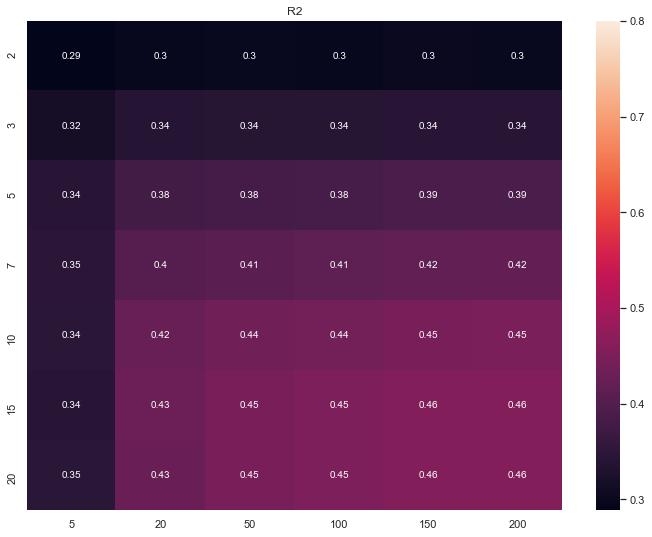

In [98]:
min_samples_split_list = [2, 3, 5]
max_depth_list = [2, 3, 5, 7, 10, 15, 20]
n_estimators_list = [5, 20, 50, 100, 150, 200]
df_result = pd.DataFrame(index=max_depth_list, columns=n_estimators_list)

max_mean_r2 = 0
max_parameter = None

for min_samples_split in min_samples_split_list:
    for max_depth in max_depth_list:
        for n_estimators in n_estimators_list:
            print()
            print(f'Random Forest: min_samples_split={min_samples_split}, max_depth={max_depth:.4f}, n_estimators={n_estimators}')
            model_pipeline = Pipeline([
                 ('preprocessor', preprocessor),
                 ('reg', RandomForestRegressor(min_samples_split=min_samples_split,
                                               max_depth=max_depth, 
                                               n_estimators=n_estimators,
                                               random_state=0))
            ])

            model_pipeline, mean_r2 = run_model(model_pipeline, X_train_all, y_train_all)
            
            if mean_r2 > max_mean_r2:
                max_parameter = model_pipeline['reg']
            df_result.loc[max_depth, n_estimators] = mean_r2

df_result = df_result.astype(float)
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(df_result, vmax=.8, annot=True)
plt.title('R2')

In [99]:
max_parameter

RandomForestRegressor(max_depth=20, min_samples_split=5, n_estimators=200,
                      random_state=0)

## ExtraTrees


Random Forest: min_samples_split=2, max_depth=2.0000, n_estimators=5
r2        : 27.80%
neg_mean_squared_error: -46.86%

Random Forest: min_samples_split=2, max_depth=2.0000, n_estimators=20
r2        : 28.72%
neg_mean_squared_error: -46.30%

Random Forest: min_samples_split=2, max_depth=2.0000, n_estimators=50
r2        : 28.52%
neg_mean_squared_error: -46.42%

Random Forest: min_samples_split=2, max_depth=2.0000, n_estimators=100
r2        : 28.76%
neg_mean_squared_error: -46.26%

Random Forest: min_samples_split=2, max_depth=2.0000, n_estimators=150
r2        : 28.58%
neg_mean_squared_error: -46.37%

Random Forest: min_samples_split=2, max_depth=2.0000, n_estimators=200
r2        : 28.75%
neg_mean_squared_error: -46.26%

Random Forest: min_samples_split=2, max_depth=3.0000, n_estimators=5
r2        : 32.01%
neg_mean_squared_error: -44.16%

Random Forest: min_samples_split=2, max_depth=3.0000, n_estimators=20
r2        : 32.80%
neg_mean_squared_error: -43.62%

Random Forest: min_sam

r2        : 45.67%
neg_mean_squared_error: -35.23%

Random Forest: min_samples_split=3, max_depth=10.0000, n_estimators=50
r2        : 46.35%
neg_mean_squared_error: -34.82%

Random Forest: min_samples_split=3, max_depth=10.0000, n_estimators=100
r2        : 46.42%
neg_mean_squared_error: -34.78%

Random Forest: min_samples_split=3, max_depth=10.0000, n_estimators=150
r2        : 46.71%
neg_mean_squared_error: -34.60%

Random Forest: min_samples_split=3, max_depth=10.0000, n_estimators=200
r2        : 46.70%
neg_mean_squared_error: -34.60%

Random Forest: min_samples_split=3, max_depth=15.0000, n_estimators=5
r2        : 38.56%
neg_mean_squared_error: -39.70%

Random Forest: min_samples_split=3, max_depth=15.0000, n_estimators=20
r2        : 45.85%
neg_mean_squared_error: -35.12%

Random Forest: min_samples_split=3, max_depth=15.0000, n_estimators=50
r2        : 47.58%
neg_mean_squared_error: -34.03%

Random Forest: min_samples_split=3, max_depth=15.0000, n_estimators=100
r2        : 4

Text(0.5, 1.0, 'R2')

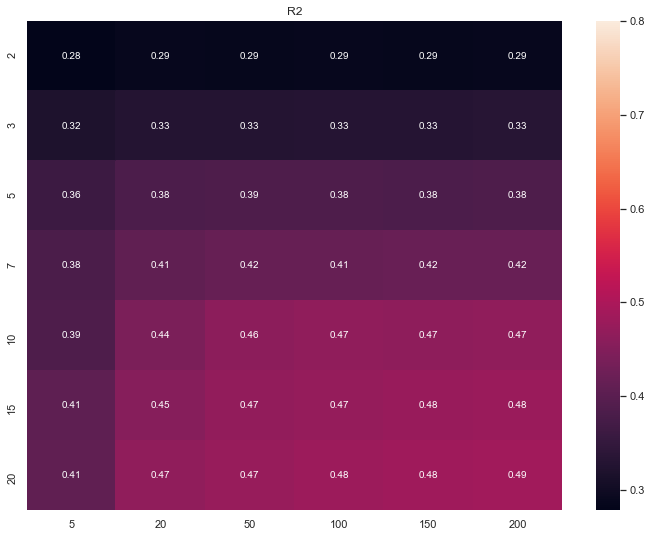

In [102]:
min_samples_split_list = [2, 3, 5]
max_depth_list = [2, 3, 5, 7, 10, 15, 20]
n_estimators_list = [5, 20, 50, 100, 150, 200]
df_result = pd.DataFrame(index=max_depth_list, columns=n_estimators_list)

max_mean_r2 = 0
max_parameter = None

for min_samples_split in min_samples_split_list:
    for max_depth in max_depth_list:
        for n_estimators in n_estimators_list:
            print()
            print(f'Random Forest: min_samples_split={min_samples_split}, max_depth={max_depth:.4f}, n_estimators={n_estimators}')
            model_pipeline = Pipeline([
                 ('preprocessor', preprocessor),
                 ('reg', ExtraTreesRegressor(min_samples_split=min_samples_split,
                                             max_depth=max_depth, 
                                             n_estimators=n_estimators,
                                             random_state=0))
            ])

            model_pipeline, mean_r2 = run_model(model_pipeline, X_train_all, y_train_all)
            
            if mean_r2 > max_mean_r2:
                max_parameter = model_pipeline['reg']
            df_result.loc[max_depth, n_estimators] = mean_r2

df_result = df_result.astype(float)
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(df_result, vmax=.8, annot=True)
plt.title('R2')

In [103]:
max_parameter

ExtraTreesRegressor(max_depth=20, min_samples_split=5, n_estimators=200,
                    random_state=0)

## LightGBM


Random Forest: min_samples_split=5, max_depth=2.0000, n_estimators=5
r2        : 17.74%
neg_mean_squared_error: -53.39%

Random Forest: min_samples_split=5, max_depth=2.0000, n_estimators=20
r2        : 33.62%
neg_mean_squared_error: -43.10%

Random Forest: min_samples_split=5, max_depth=2.0000, n_estimators=50
r2        : 37.77%
neg_mean_squared_error: -40.38%

Random Forest: min_samples_split=5, max_depth=2.0000, n_estimators=100
r2        : 39.29%
neg_mean_squared_error: -39.41%

Random Forest: min_samples_split=5, max_depth=2.0000, n_estimators=150
r2        : 39.94%
neg_mean_squared_error: -38.99%

Random Forest: min_samples_split=5, max_depth=2.0000, n_estimators=200
r2        : 40.22%
neg_mean_squared_error: -38.82%

Random Forest: min_samples_split=5, max_depth=3.0000, n_estimators=5
r2        : 20.30%
neg_mean_squared_error: -51.74%

Random Forest: min_samples_split=5, max_depth=3.0000, n_estimators=20
r2        : 36.14%
neg_mean_squared_error: -41.45%

Random Forest: min_sam

r2        : 39.48%
neg_mean_squared_error: -39.28%

Random Forest: min_samples_split=5, max_depth=10.0000, n_estimators=50
r2        : 42.00%
neg_mean_squared_error: -37.61%

Random Forest: min_samples_split=5, max_depth=10.0000, n_estimators=100
r2        : 42.83%
neg_mean_squared_error: -37.09%

Random Forest: min_samples_split=5, max_depth=10.0000, n_estimators=150
r2        : 42.86%
neg_mean_squared_error: -37.08%

Random Forest: min_samples_split=5, max_depth=10.0000, n_estimators=200
r2        : 42.57%
neg_mean_squared_error: -37.28%

Random Forest: min_samples_split=5, max_depth=15.0000, n_estimators=5
r2        : 24.56%
neg_mean_squared_error: -48.96%

Random Forest: min_samples_split=5, max_depth=15.0000, n_estimators=20
r2        : 39.45%
neg_mean_squared_error: -39.29%

Random Forest: min_samples_split=5, max_depth=15.0000, n_estimators=50
r2        : 42.22%
neg_mean_squared_error: -37.47%

Random Forest: min_samples_split=5, max_depth=15.0000, n_estimators=100
r2        : 4

r2        : 39.09%
neg_mean_squared_error: -39.51%

Random Forest: min_samples_split=5, max_depth=3.0000, n_estimators=100
r2        : 40.69%
neg_mean_squared_error: -38.47%

Random Forest: min_samples_split=5, max_depth=3.0000, n_estimators=150
r2        : 41.08%
neg_mean_squared_error: -38.26%

Random Forest: min_samples_split=5, max_depth=3.0000, n_estimators=200
r2        : 41.36%
neg_mean_squared_error: -38.09%

Random Forest: min_samples_split=5, max_depth=5.0000, n_estimators=5
r2        : 24.12%
neg_mean_squared_error: -49.24%

Random Forest: min_samples_split=5, max_depth=5.0000, n_estimators=20
r2        : 39.40%
neg_mean_squared_error: -39.30%

Random Forest: min_samples_split=5, max_depth=5.0000, n_estimators=50
r2        : 41.84%
neg_mean_squared_error: -37.71%

Random Forest: min_samples_split=5, max_depth=5.0000, n_estimators=100
r2        : 43.27%
neg_mean_squared_error: -36.82%

Random Forest: min_samples_split=5, max_depth=5.0000, n_estimators=150
r2        : 43.36%
n

Text(0.5, 1.0, 'R2')

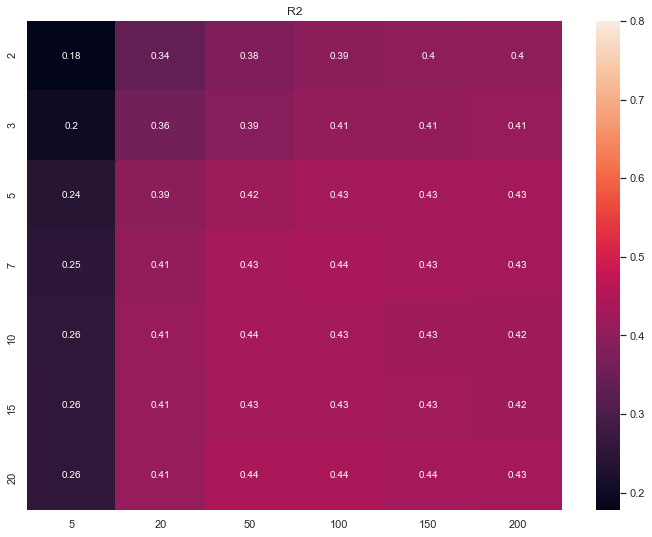

In [106]:
# https://towardsdatascience.com/kagglers-guide-to-lightgbm-hyperparameter-tuning-with-optuna-in-2021-ed048d9838b5

num_leaves_list = [10, 20, 30, 50]
max_depth_list = [2, 3, 5, 7, 10, 15, 20]
n_estimators_list = [5, 20, 50, 100, 150, 200]
df_result = pd.DataFrame(index=max_depth_list, columns=n_estimators_list)

max_mean_r2 = 0
max_parameter = None

for num_leaves in num_leaves_list:
    for max_depth in max_depth_list:
        for n_estimators in n_estimators_list:
            print()
            print(f'Random Forest: num_leaves={num_leaves}, max_depth={max_depth:.4f}, n_estimators={n_estimators}')
            model_pipeline = Pipeline([
                 ('preprocessor', preprocessor),
                 ('reg', lgb.LGBMRegressor(num_leaves=num_leaves,
                                           max_depth=max_depth, 
                                           n_estimators=n_estimators,
                                           random_state=0))
            ])

            model_pipeline, mean_r2 = run_model(model_pipeline, X_train_all, y_train_all)
            
            if mean_r2 > max_mean_r2:
                max_parameter = model_pipeline['reg']
            df_result.loc[max_depth, n_estimators] = mean_r2

df_result = df_result.astype(float)
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(df_result, vmax=.8, annot=True)
plt.title('R2')



In [107]:
max_parameter

LGBMRegressor(max_depth=20, n_estimators=200, num_leaves=50, random_state=0)

# Test set performance

In [104]:
model_pipeline = Pipeline([
     ('preprocessor', preprocessor),
     ('reg', ExtraTreesRegressor(min_samples_split=5,
                                 max_depth=20, 
                                 n_estimators=200,
                                 random_state=0))
])

model_pipeline, _ = run_model(model_pipeline, X_train_all, y_train_all)


name = 'best_model'
y_test_predict = model_pipeline.predict(X_test)
r2_oos = r2_score(y_test, y_test_predict)
MSE_oos = mean_squared_error(y_test, y_test_predict)    

print("Model: {n:s}, out-of-sample R^2: {r:3.2%}, MSE: {m:3.2%}".format(n=name, r=r2_oos, m=MSE_oos))

r2        : 48.60%
neg_mean_squared_error: -33.38%
Model: best_model, out-of-sample R^2: 55.36%, MSE: 29.78%


In [109]:
model_pipeline = Pipeline([
     ('preprocessor', preprocessor),
     ('reg', lgb.LGBMRegressor(num_leaves=50,
                               max_depth=20, 
                               n_estimators=200,
                               random_state=0))
])

model_pipeline, _ = run_model(model_pipeline, X_train_all, y_train_all)


name = 'best_model'
y_test_predict = model_pipeline.predict(X_test)
r2_oos = r2_score(y_test, y_test_predict)
MSE_oos = mean_squared_error(y_test, y_test_predict)    

print("Model: {n:s}, out-of-sample R^2: {r:3.2%}, MSE: {m:3.2%}".format(n=name, r=r2_oos, m=MSE_oos))

r2        : 43.16%
neg_mean_squared_error: -36.78%
Model: best_model, out-of-sample R^2: 50.61%, MSE: 32.95%
